#### imports

In [2]:
import os
import cv2
from sklearn.cluster import k_means, KMeans

# from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator, ClassifierMixin, ClusterMixin

# from sklearn.datasets import load_iris
# from sklearn.model_selection import train_test_split
import numpy as np
# from numba import njit

import matplotlib.pyplot as plt
import pandas as pd
import json
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline

from sklearn.metrics.cluster import adjusted_rand_score  # , ran

# from sklearn import datasets
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


%matplotlib inline
import random
from PIL import Image
import PIL.ImageOps    

import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import torchvision.utils
import torch
from torch.autograd import Variable
import torch.nn as nn
from torch import optim
import torch.nn.functional as F

In [3]:
def uqi(img1, img2):
    """
    Calculate the Universal Quality Image Index (UQI) between two images.

    Parameters:
    img1 (numpy array): First image (reference image).
    img2 (numpy array): Second image (image to be compared).

    Returns:
    float: UQI value between -1 and 1.
    """
    assert img1.shape == img2.shape, "Images must have the same dimensions"
    
    N = img1.size
    
    # Means
    mean1 = np.mean(img1)
    mean2 = np.mean(img2)
    
    # Variances and covariance
    var1 = np.var(img1)
    var2 = np.var(img2)
    covar = np.mean((img1 - mean1) * (img2 - mean2))
    
    # UQI calculation
    numerator = 4 * covar * mean1 * mean2
    denominator = (var1 + var2) * (mean1**2 + mean2**2)
    
    if denominator == 0:
        return 1 if numerator == 0 else 0
    
    uqi_value = numerator / denominator
    return uqi_value


In [4]:
def uqi(image1, image2, mean_result=False):
    def calc_uqi(img1, img2):
        """
        Calculate the Universal Quality Image Index (UQI) between two images.

        Parameters:
        img1 (numpy array): First image (reference image).
        img2 (numpy array): Second image (image to be compared).

        Returns:
        float: UQI value between -1 and 1.
        """
        assert img1.shape == img2.shape, "Images must have the same dimensions"
        
        N = img1.size
        
        # Means
        mean1 = np.mean(img1)
        mean2 = np.mean(img2)
        
        # Variances and covariance
        var1 = np.var(img1)
        var2 = np.var(img2)
        covar = np.mean((img1 - mean1) * (img2 - mean2))
        
        # UQI calculation
        numerator = 4 * covar * mean1 * mean2
        denominator = (var1 + var2) * (mean1**2 + mean2**2)
        
        if denominator == 0:
            return 1 if numerator == 0 else 0
        
        uqi_value = numerator / denominator
        return uqi_value  
 
    if not mean_result:
        return [calc_uqi(image1[...,channel], image2[...,channel]) for channel in range(3)]
    
    return [calc_uqi(image1, image2)]

def calculate_histogram(image, bins=256):
    """
    Calculate the histogram of an image.
    
    Parameters:
    image (numpy array): Input image.
    bins (int): Number of bins for the histogram.
    
    Returns:
    numpy array: Histogram of the image.
    """
    hist = np.array([cv2.calcHist(images=[image], channels=[channel], mask=None, histSize = [bins], ranges=[0, 256]) \
            for channel in range(3)]).T
    # hist = cv2.normalize(hist, hist).flatten()
    return hist

def calc_ssim(img1, img2, C1=1e-4, C2=9e-4, mean_result=True):
    """
    # por cor sem media
    # reformular a estrutura dos  nomes
    
    Calculate SSIM between two histograms.
    
    Parameters:
    img1 (numpy array): Histogram of the first image.
    img2 (numpy array): Histogram of the second image.
    C1 (float): Constant to avoid division by zero.
    C2 (float): Constant to avoid division by zero.
    
    Returns:
    float: SSIM value.
    """
    def hist_ssim(img1, img2):
        mu_x = np.mean(img1)
        mu_y = np.mean(img2)
        sigma_x = np.var(img1)
        sigma_y = np.var(img2)
        sigma_xy = np.mean((img1 - mu_x) * (img2 - mu_y))
        
        return ((2 * mu_x * mu_y + C1) * (2 * sigma_xy + C2)) / ((mu_x ** 2 + mu_y ** 2 + C1) * (sigma_x + sigma_y + C2))
    
    # print("="*50)
    # print(type(img1))
    # print(img1.shape)
    # print(img1[...,[0]].shape)
    if len(img1.shape) > 2:
        hssim = [hist_ssim(img1[...,channel], img2[...,channel]) for channel in range(img1.shape[-1])]
    else:
        hssim = [hist_ssim(img1, img2)]

    
    # if not mean_result:
    #     return hssim
    
    # return [np.mean(hssim)]
    return hssim

def ssim_new(img1, img2, C1=1e-4, C2=9e-4, mean_result=True):
    """
    # por cor sem media
    # reformular a estrutura dos  nomes
    
    Calculate SSIM between two histograms.
    
    Parameters:
    img1 (numpy array): Histogram of the first image.
    img2 (numpy array): Histogram of the second image.
    C1 (float): Constant to avoid division by zero.
    C2 (float): Constant to avoid division by zero.
    
    Returns:
    float: SSIM value.
    """
    def calc_variable(img1, img2):
        k1 = 0.01 
        k2 = 0.03
        # L = 255
        L = 1
        c1 = (k1*L)**2
        c2 = (k2*L)**2
        c3 = c2/2
        # c1, c2, c3

        mu_x = np.mean(img1)
        mu_y = np.mean(img2)
        sigma_x = np.var(img1)
        sigma_y = np.var(img2)
        sigma_xy = np.mean((img1 - mu_x) * (img2 - mu_y))

        return ((2 * mu_x * mu_y + c1) * (2 * sigma_xy + c2)) / (( (mu_x ** 2) + (mu_y ** 2) + c1) * (sigma_x**2 + sigma_y**2 + c2) ) 

    
    # print("="*50)
    # print(type(img1))
    # print(img1.shape)
    # print(img1[...,[0]].shape)
    if len(img1.shape) > 2:
        hssim = [calc_variable(img1[...,channel], img2[...,channel]) for channel in range(img1.shape[-1])]
    else:
        hssim = [calc_variable(img1, img2)]

    
    # if not mean_result:
    #     return hssim
    
    # return [np.mean(hssim)]
    return hssim

def ssim_lcs(img1, img2, C1=1e-4, C2=9e-4, mean_result=True):
    """
    # por cor sem media
    # reformular a estrutura dos  nomes
    
    Calculate SSIM between two histograms.
    
    Parameters:
    img1 (numpy array): Histogram of the first image.
    img2 (numpy array): Histogram of the second image.
    C1 (float): Constant to avoid division by zero.
    C2 (float): Constant to avoid division by zero.
    
    Returns:
    float: SSIM value.
    """
    def calc_variable(img1, img2):
        k1 = 0.01 
        k2 = 0.03
        L = 255
        c1 = (k1*L)**2
        c2 = (k2*L)**2
        c3 = c2/2
        # c1, c2, c3

        mu_x = np.mean(img1)
        mu_y = np.mean(img2)
        sigma_x = np.var(img1)
        sigma_y = np.var(img2)
        sigma_xy = np.mean((img1 - mu_x) * (img2 - mu_y))
        
        l = ((2 * mu_x * mu_y + c1)  / (mu_x ** 2 + mu_y ** 2 + c1))
        c = ((2 * sigma_x * sigma_y + c2)  / (sigma_x + sigma_y + c2))
        s = ((sigma_xy + c3) / (sigma_x * sigma_y + c3))
        return l, c, s

    
    # print("="*50)
    # print(type(img1))
    # print(img1.shape)
    # print(img1[...,[0]].shape)
    if len(img1.shape) > 2:
        hssim = [calc_variable(img1[...,channel], img2[...,channel]) for channel in range(img1.shape[-1])]
    else:
        hssim = [calc_variable(img1, img2)]

    
    # if not mean_result:
    #     return hssim
    
    # return [np.mean(hssim)]
    return hssim


def MSER(original, compressed, mean_result = True): 
    if not mean_result:
        mse = [np.mean((original[...,channel] - compressed[...,channel]) ** 2) for channel in range(3)]
        return np.sqrt(mse)
    
    mse = np.mean((original - compressed) ** 2) 
    return [np.sqrt(mse)]

def PSNR(original, compressed, mean_result = True):
    if not mean_result:
        return [cv2.PSNR(original[...,channel], compressed[...,channel]) for channel in range(3)]
    return [cv2.PSNR(original, compressed)]

def metricas(image1, image2,  mean_result=True):
    def concat(valores):
        return " ".join([f"{valor:.4f}" for valor in valores])
    
    gray1 = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

    hist_gray1 = np.array([cv2.calcHist(images=[gray1], channels=[0], mask=None, histSize = [256], ranges=[0, 256])]).T
    hist_gray2 = np.array([cv2.calcHist(images=[gray2], channels=[0], mask=None, histSize = [256], ranges=[0, 256])]).T

    hist1 = calculate_histogram(image1)
    hist2 = calculate_histogram(image2)

    uqi_value = uqi(image1, image2, mean_result=False)

    # Calcular SSIM entre histogramas

    s_s = []; s_hs = []; s_u = [];s_psnr = []; s_rmse = []
    
    ssim = calc_ssim(image1, image2, mean_result=False)
    hssim = calc_ssim(hist1, hist2, mean_result=False)
    psnr = PSNR(image1, image2, mean_result=False)
    rmse = MSER(image1, image2, mean_result=False)

    s_s.extend(ssim)
    s_hs.extend(hssim)
    s_u.extend(uqi_value)
    s_rmse.extend(rmse)
    s_psnr.extend(psnr)
    
    print("por cor")
    print(f"SSIM : {concat(ssim)}")
    print(f"SSIM entre histogramas: {concat(hssim)}")
    print(f"UQI: {concat(uqi_value)}")
    print(f"MSER: {concat(rmse)}")
    print(f"PSNR: {concat(psnr)}")


    uqi_value = uqi(gray1, gray2, mean_result=True)

    ssim = calc_ssim(gray1, gray2, mean_result=True)
    hssim = calc_ssim(hist_gray1, hist_gray2, mean_result=True)
    psnr = PSNR(gray1, gray2, mean_result=True)
    rmse = MSER(gray1, gray2, mean_result=True)

    s_s.extend(ssim)
    s_hs.extend(hssim)
    s_u.extend(uqi_value)
    s_rmse.extend(rmse)
    s_psnr.extend(psnr)

    print("cinza")
    print(f"SSIM : {concat(ssim)}")
    print(f"SSIM entre histogramas: {concat(hssim)}")
    print(f"UQI: {concat(uqi_value)}")
    print(f"MSER: {concat(rmse)}")
    print(f"PSNR: {concat(psnr)}")

    return s_s, s_hs, s_u, s_rmse, s_psnr

    # return ssim, hssim, uqi_value

In [5]:
# def metricas(image1, image2):
#     uqi_value = uqi(image1, image2)

#     hist1 = calculate_histogram(image1)
#     hist2 = calculate_histogram(image2)

#     # Calcular SSIM entre histogramas
#     ssim = ssim_histogram(image1, image2)
#     hssim = ssim_histogram(hist1, hist2)
#     print(f"SSIM : {ssim:.4f}")
#     print(f"SSIM entre histogramas: {hssim:.4f}")
#     print(f"UQI: {uqi_value:.4f}")
#     return ssim, hssim, uqi_value

### colect data

##### CustomImageDataset

In [6]:
from torch.utils.data import Dataset
import xml.etree.ElementTree as ET
import numpy as np


class CustomImageDataset(Dataset):
    def __init__(
        self,
        dataset_dir="./datasets/eBDtheque_database_v3/",
        # annotations_file="GT/SAINTOGAN_PROSPER_ET_LE_MONSTRE_MARIN_016.svg",
        annotations_file=None,
        img_name="Pages/SAINTOGAN_PROSPER_ET_LE_MONSTRE_MARIN_016.jpg",
        norm=False,
        torch_transform=False,
        image_shape=None,
        color_begin=None, #cv2.COLOR_RGB2HSV,
        color_end=None, #cv2.COLOR_HSV2RGB,
        blur = False,
    ):
        # = (1080, 1080, 3),
        self.dataset_dir = dataset_dir
        self.img_name = img_name
        self.annotations_file = annotations_file
        self.norm = norm
        self.torch_transform = torch_transform
        self.image_shape = image_shape
        self.color_begin = color_begin
        self.color_end = color_end
        self.blur = blur

        if self.annotations_file:
            label_path = os.path.join(self.dataset_dir, self.annotations_file)

            tree = ET.parse(label_path)
            self.boxes = []

            for elem in tree.iter():
                if elem.attrib.get("class") == "Panel":
                    box = np.zeros((5))
                    for attr in list(elem):
                        x_ys = attr.attrib.get("points").split(" ")

                        valores = np.concatenate([x_ys.split(",") for x_ys in x_ys])
                        valores = valores.astype(int)
                        x_min = min(valores[0::2])
                        x_max = max(valores[0::2])

                        y_min = min(valores[1::2])
                        y_max = max(valores[1::2])

                        box = [
                            x_min,
                            y_min,
                            x_max,
                            y_max,
                        ]

                        self.boxes.append(np.asarray(box))

    def __len__(self):
        return len(self.boxes)

    def __getitem__(self, idx, blur=False, reshape=False):
        img_path = os.path.join(self.dataset_dir, self.img_name)
        if self.image_shape:
            # "RGB"
            img = np.array(
                Image.open(img_path).convert("RGB").resize(self.image_shape[:2])
            )
        else:
            img = np.array(Image.open(img_path).convert("RGB"))
            

        if self.annotations_file:
            x_min, y_min, x_max, y_max = self.boxes[idx]
            x_min, y_min, x_max, y_max = int(x_min), int(y_min), int(x_max), int(y_max)
            img = img[y_min:y_max, x_min:x_max]
        
        if self.color_begin:            
            img = cv2.cvtColor(img, self.color_begin)
            
        if blur:     
            img = cv2.medianBlur(img, 3)

        if self.color_begin:            
            img = cv2.cvtColor(img, self.color_end)

        if self.norm:
            img = img / 255

        if reshape:
            img = img.reshape(-1, img.shape[-1])

        # torch.from_numpy()
        if self.torch_transform:
            return torch.from_numpy(img)  # , torch.ones(1)

        return img  

    def reverse(self, img: torch.Tensor, trueColor = True):
        if self.norm:
            img = img * 255

        # torch.from_numpy()
        if self.torch_transform:
            img = img.numpy()  # , torch.ones(1)

        img = img.astype(np.uint8)
        if (not trueColor) and self.color_end:
            img = cv2.cvtColor(img, self.color_end)

        return img


class CustomSizeImageDataset(Dataset):
    def __init__(
        self,
        dataset_dir="./datasets/eBDtheque_database_v3/",
        annotations_file="GT/SAINTOGAN_PROSPER_ET_LE_MONSTRE_MARIN_016.svg",
        img_name="Pages/SAINTOGAN_PROSPER_ET_LE_MONSTRE_MARIN_016.jpg",
        norm=False,
        torch_transform=False,
        image_shape=(1080, 1080, 3),
    ):
        self.dataset_dir = dataset_dir
        self.img_name = img_name
        self.annotations_file = annotations_file
        self.norm = norm
        self.torch_transform = torch_transform
        self.image_shape = image_shape

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        img_path = os.path.join(self.dataset_dir, self.img_name)

        img = np.array(Image.open(img_path).convert("RGB").resize(self.image_shape[:2]))

        if self.norm:
            img = img / 255

        if self.torch_transform:
            return torch.from_numpy(img)

        return img

    def reverse(self, img):
        if self.norm:
            img = img * 255

        # torch.from_numpy()
        if self.torch_transform:
            img = img.numpy()  # , torch.ones(1)
        return img.astype(np.uint8)

In [7]:
tol = 0.5

#### eBDtheque_database_v3 Page CYB_COSMOZONE

In [8]:
resultados = []

In [9]:
dataset = CustomImageDataset(
    dataset_dir="./datasets/eBDtheque_database_v3/",
    annotations_file="GT/SAINTOGAN_PROSPER_ET_LE_MONSTRE_MARIN_016.svg",
    img_name="Pages/SAINTOGAN_PROSPER_ET_LE_MONSTRE_MARIN_016.jpg",
    norm=True,
    torch_transform=False,
    color_begin=cv2.COLOR_RGB2HSV,
    color_end=cv2.COLOR_HSV2RGB,
    blur=True,
)

In [10]:
# from Pill import Image 
from PIL import Image, ImageDraw, ImageFont
import numpy as np

img_path = "./datasets/eBDtheque_database_v3/Pages/CYB_COSMOZONE_012.jpg"

image = np.array(Image.open(img_path).convert("RGB"))
# image_shape_out = 320, 320, 3
image_shape_out = image.shape

print(image.shape)
image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

image = cv2.medianBlur(image, 3)

image = cv2.cvtColor(image, cv2.COLOR_HSV2RGB)

X = image[:image_shape_out[0],\
                     :image_shape_out[1], \
                        :image_shape_out[2]].reshape(-1, image_shape_out[2]) /255

            

print(X.shape)

(661, 569, 3)
(376109, 3)


In [11]:
# image 출력 함수 정의
def show_img_bbox(X, y):
    plt.figure(figsize=(20, 20))
    for i, img in enumerate([X, y]):
        plt.subplot(1, 2, i+1)
        plt.imshow(img)


#### c = 20

In [12]:
panel = 2 
num_class = 20

##### fit

In [13]:
dataset.__getitem__(panel, blur=True).reshape(-1, dataset[panel].shape[-1]).shape

(336600, 3)

In [14]:
model = KMeans(n_clusters=num_class, n_init=50, tol=tol, verbose=True)
model.fit(dataset.__getitem__(panel, blur=True, reshape=True), None)

Initialization complete
Iteration 0, inertia 804.464282968095.
Converged at iteration 0: center shift 0.013834047836358766 within tolerance 0.026506574729552906.
Initialization complete
Iteration 0, inertia 767.8815071127287.
Converged at iteration 0: center shift 0.009588015419852554 within tolerance 0.026506574729552906.
Initialization complete
Iteration 0, inertia 820.2730642062018.
Converged at iteration 0: center shift 0.011018519591096957 within tolerance 0.026506574729552906.
Initialization complete
Iteration 0, inertia 777.3607996923942.
Converged at iteration 0: center shift 0.012264075642329066 within tolerance 0.026506574729552906.
Initialization complete
Iteration 0, inertia 798.5757785467079.
Converged at iteration 0: center shift 0.011868140161800421 within tolerance 0.026506574729552906.
Initialization complete
Iteration 0, inertia 797.6524106113042.
Converged at iteration 0: center shift 0.012596649610298695 within tolerance 0.026506574729552906.
Initialization complete

KMeans(n_clusters=20, n_init=50, tol=0.5, verbose=True)

In [15]:
y = model.predict(dataset.__getitem__(panel, reshape=True).reshape(-1, dataset[panel].shape[-1]))

In [16]:
model.cluster_centers_

array([[0.77843025, 0.68652174, 0.57664729],
       [0.15649593, 0.18480796, 0.15156806],
       [0.69843116, 0.43044887, 0.32298076],
       [0.75879346, 0.5368775 , 0.42110189],
       [0.28618759, 0.2505549 , 0.19987482],
       [0.11613748, 0.12152722, 0.08385983],
       [0.52732554, 0.41690041, 0.33850438],
       [0.69813475, 0.35097441, 0.25768709],
       [0.77504614, 0.59620551, 0.47999248],
       [0.68920591, 0.24152774, 0.1094281 ],
       [0.71045836, 0.63050735, 0.51587123],
       [0.20765908, 0.27695732, 0.26469045],
       [0.37155485, 0.33446936, 0.2798226 ],
       [0.57559902, 0.52008511, 0.43827385],
       [0.71886695, 0.4866163 , 0.37902135],
       [0.77467766, 0.44011651, 0.34086524],
       [0.76034456, 0.66359622, 0.55163621],
       [0.54593313, 0.31887179, 0.23696336],
       [0.26053412, 0.1474312 , 0.07844301],
       [0.4029553 , 0.20928688, 0.13515003]])

In [17]:
# y_image = (model.cluster_centers_[y].reshape(image_shape_out)*255).astype(np.uint8)
y_image = dataset.reverse(model.cluster_centers_[y].reshape(dataset[panel].shape))

In [18]:
from cmeans import save_model

In [19]:
filename = img_path.split("/")[-1]
set_name = "results/minimal/k_means/comics/"
dir_out_model = f"{set_name}model/{num_class}/model.json"
save_model(model, dir_out_model)

print(str.upper(filename.split(".")[-1]))
dir_original_img = f"{set_name}imgs/original/"
if not os.path.isfile(dir_original_img):
    os.makedirs(dir_original_img, exist_ok=True)
Image.fromarray(dataset.reverse(dataset[panel])).save(f"{dir_original_img}{panel}{filename}.png")

dir_out_img = f"{set_name}imgs/{num_class}/"
if not os.path.isfile(dir_out_img):
    os.makedirs(dir_out_img, exist_ok=True)

Image.fromarray(y_image).save(f"{dir_out_img}{panel}{filename}.png")


ssim, hssim, q, rmse, psnr = metricas(dataset.reverse(dataset[panel]), y_image, mean_result=False)
r = []
r.extend(ssim), r.extend(hssim), r.extend(q), r.extend(rmse), r.extend(psnr)
resultados.append(r)
resultados.append([ssim, hssim, q])

JPG
por cor
SSIM : 0.9917 0.9931 0.9898
SSIM entre histogramas: 0.1775 0.1380 0.1105
UQI: 0.9917 0.9931 0.9898
MSER: 6.9112 5.8210 5.8920
PSNR: 28.7884 31.7392 31.3584
cinza
SSIM : 0.9962
SSIM entre histogramas: 0.1447
UQI: 0.9962
MSER: 4.9488
PSNR: 33.9973


In [20]:
# y_image

##### show

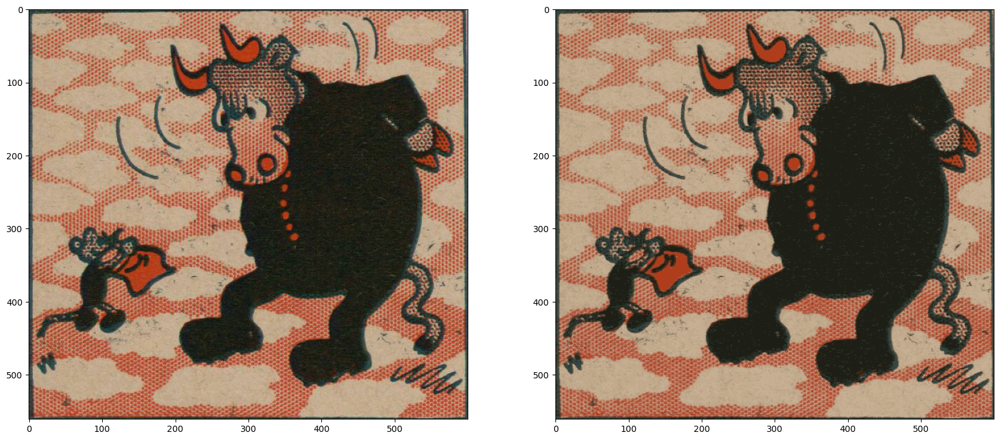

In [21]:
show_img_bbox(dataset.reverse(dataset[panel]), y_image)

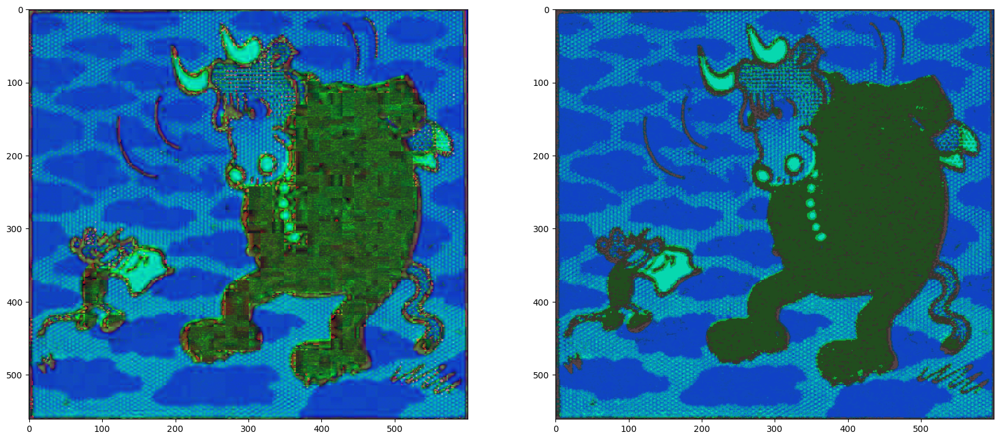

In [22]:
x_hsv = cv2.cvtColor(dataset.reverse(dataset[panel]), cv2.COLOR_RGB2HSV)
y_hsv = cv2.cvtColor(y_image, cv2.COLOR_RGB2HSV)
show_img_bbox(x_hsv, y_hsv)

#### c = 10

In [23]:
num_class = 10

##### fit

In [24]:
# model = FuzzyCMeansGaussianS2(num_class=10, epochs=50, threshold=.5, verbose=True)
model = KMeans(n_clusters=num_class, n_init=50, tol=tol, verbose=True)
model.fit(dataset.__getitem__(panel, blur=True, reshape=True), None)


Initialization complete
Iteration 0, inertia 1297.7649519416325.
Converged at iteration 0: center shift 0.004530502596302318 within tolerance 0.026506574729552906.
Initialization complete
Iteration 0, inertia 1290.8053517877647.
Converged at iteration 0: center shift 0.0074475486090365755 within tolerance 0.026506574729552906.
Initialization complete
Iteration 0, inertia 1402.620915032906.
Converged at iteration 0: center shift 0.011750989328853217 within tolerance 0.026506574729552906.
Initialization complete
Iteration 0, inertia 1360.8577623990518.
Converged at iteration 0: center shift 0.01342101455895818 within tolerance 0.026506574729552906.
Initialization complete
Iteration 0, inertia 1275.7622914263166.
Converged at iteration 0: center shift 0.006822366837236063 within tolerance 0.026506574729552906.
Initialization complete
Iteration 0, inertia 1379.3201076510531.
Converged at iteration 0: center shift 0.009804817404906836 within tolerance 0.026506574729552906.
Initialization co

KMeans(n_clusters=10, n_init=50, tol=0.5, verbose=True)

In [25]:
model.cluster_centers_

array([[0.38799463, 0.2511766 , 0.18758426],
       [0.75565746, 0.58508578, 0.46999757],
       [0.12137189, 0.12580342, 0.08814054],
       [0.68780517, 0.38216649, 0.28533757],
       [0.76288728, 0.66818046, 0.55664501],
       [0.18694689, 0.22981637, 0.19813652],
       [0.74147772, 0.48494167, 0.37641095],
       [0.4856371 , 0.42589966, 0.35202147],
       [0.67357469, 0.2526519 , 0.13285697],
       [0.27308559, 0.31406928, 0.29194272]])

In [26]:
y = model.predict(dataset[panel].reshape(-1, dataset[panel].shape[-1]))

In [27]:
y_image = dataset.reverse(model.cluster_centers_[y].reshape(dataset[panel].shape))

# y_image = (model.cluster_centers_[y].reshape(image_shape_out)*255).astype(np.uint8)

In [28]:
filename = img_path.split("/")[-1]
set_name = "results/minimal/k_means/comics/"
dir_out_model = f"{set_name}model/{num_class}/model.json"
save_model(model, dir_out_model)

print(str.upper(filename.split(".")[-1]))
dir_original_img = f"{set_name}imgs/original/"
if not os.path.isfile(dir_original_img):
    os.makedirs(dir_original_img, exist_ok=True)
Image.fromarray(dataset.reverse(dataset[panel])).save(f"{dir_original_img}{panel}{filename}.png")

dir_out_img = f"{set_name}imgs/{num_class}/"
if not os.path.isfile(dir_out_img):
    os.makedirs(dir_out_img, exist_ok=True)

y_image = y_image.reshape(dataset[panel].shape)

Image.fromarray(y_image).save(f"{dir_out_img}{panel}{filename}.png")


ssim, hssim, q, rmse, psnr = metricas(dataset.reverse(dataset[panel]), y_image, mean_result=False)
r = []
r.extend(ssim), r.extend(hssim), r.extend(q), r.extend(rmse), r.extend(psnr)
resultados.append(r)
resultados.append([ssim, hssim, q])

JPG
por cor
SSIM : 0.9860 0.9894 0.9841
SSIM entre histogramas: 0.1348 0.0915 0.0553
UQI: 0.9860 0.9894 0.9841
MSER: 7.6130 6.7497 6.9835
PSNR: 26.5231 29.9482 29.4561
cinza
SSIM : 0.9935
SSIM entre histogramas: 0.1065
UQI: 0.9935
MSER: 6.1307
PSNR: 31.6505


##### show

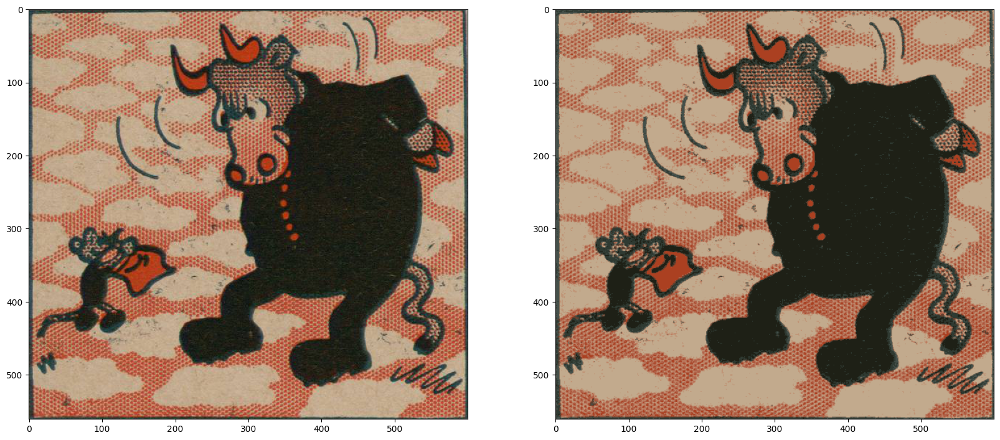

In [29]:
show_img_bbox(dataset.reverse(dataset[panel]), y_image)

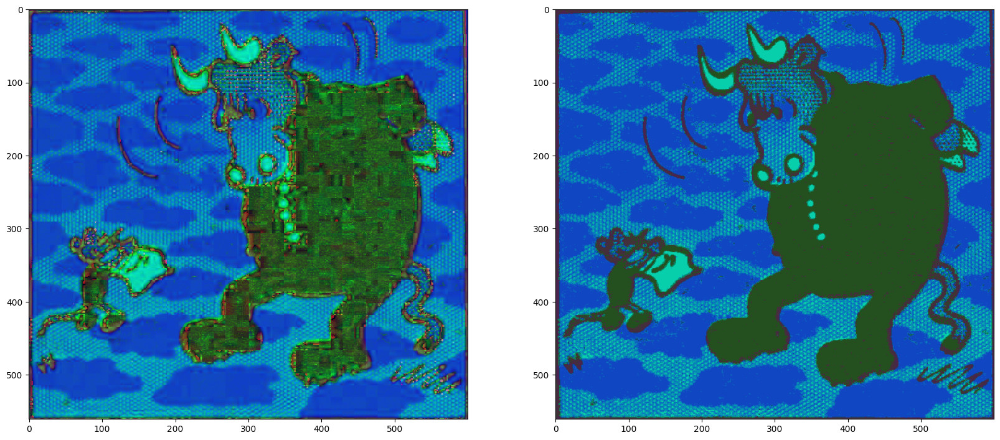

In [30]:
x_hsv = cv2.cvtColor(dataset.reverse(dataset[panel]), cv2.COLOR_RGB2HSV)
y_hsv = cv2.cvtColor(y_image, cv2.COLOR_RGB2HSV)
show_img_bbox(x_hsv, y_hsv)

In [31]:
# time change
# new row
# new column
# pure grid
# ecs_insert
# whole_row
# whole_column


#### wikiart High_Renaissance leonardo da vinci mona lisa

In [55]:
dataset = CustomImageDataset(
    # img_path="./datasets/wikiart/High_Renaissance/leonardo-da-vinci_mona-lisa.jpg",
    dataset_dir="./datasets/wikiart/High_Renaissance",
    img_name="leonardo-da-vinci_mona-lisa.jpg",
    image_shape=(1080, 1080, 3),
    norm=True,
    torch_transform=True,
    color_begin=cv2.COLOR_RGB2HSV,
    color_end=cv2.COLOR_HSV2RGB,
)

In [56]:
# from Pill import Image 
from PIL import Image, ImageDraw, ImageFont
import numpy as np

img_path = "./datasets/wikiart/High_Renaissance/leonardo-da-vinci_mona-lisa.jpg"
image_shape_out = 1080, 1080, 3
img = Image.open(img_path).convert("RGB")
img = img.resize(image_shape_out[:2])
image = np.array(img)
# image_shape_out = image.shape

print(image.shape)

image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

image = cv2.medianBlur(image, 3)

image = cv2.cvtColor(image, cv2.COLOR_HSV2RGB)

X = image[:image_shape_out[0],\
                     :image_shape_out[1], \
                        :image_shape_out[2]].reshape(-1, image_shape_out[2]) /255
print(X.shape)

(1080, 1080, 3)
(1166400, 3)


In [57]:
# image 출력 함수 정의
def show_img_bbox(X, y):
    plt.figure(figsize=(20, 20))
    for i, img in enumerate([X, y]):
        plt.subplot(1, 2, i+1)
        plt.imshow(img)


#### c = 20

In [67]:
def reverse(img: torch.Tensor):
    img = img * 255

    img = img.astype(np.uint8)

    return img

In [58]:
panel = 0
num_class = 20

##### fit

In [59]:
# model = FuzzyCMeansGaussianS2(num_class=20, epochs=50, threshold=.5, verbose=True)
model = KMeans(n_clusters=num_class, n_init=50, tol=tol, verbose=True)

model.fit(dataset.__getitem__(panel, blur=True, reshape=True), None)

Initialization complete
Iteration 0, inertia 2405.8539792382107.
Converged at iteration 0: center shift 0.007340044018763438 within tolerance 0.020918775530731293.
Initialization complete
Iteration 0, inertia 3140.4883506338874.
Converged at iteration 0: center shift 0.019072758013041983 within tolerance 0.020918775530731293.
Initialization complete
Iteration 0, inertia 2735.7389004223314.
Converged at iteration 0: center shift 0.011754273760913685 within tolerance 0.020918775530731293.
Initialization complete
Iteration 0, inertia 2599.166289887815.
Converged at iteration 0: center shift 0.012557335597632448 within tolerance 0.020918775530731293.
Initialization complete
Iteration 0, inertia 2717.698838907575.
Converged at iteration 0: center shift 0.014148575623140447 within tolerance 0.020918775530731293.
Initialization complete
Iteration 0, inertia 2653.910511341254.
Converged at iteration 0: center shift 0.00941212987823691 within tolerance 0.020918775530731293.
Initialization compl

KMeans(n_clusters=20, n_init=50, tol=0.5, verbose=True)

In [60]:
model.cluster_centers_

array([[0.10619256, 0.05200217, 0.04935089],
       [0.52233449, 0.44787354, 0.17350119],
       [0.66863772, 0.55603286, 0.22256981],
       [0.44424232, 0.21797622, 0.07860814],
       [0.96789587, 0.78111812, 0.26841367],
       [0.25041649, 0.14775302, 0.0743365 ],
       [0.83816049, 0.52166881, 0.12854954],
       [0.33088738, 0.26762395, 0.09968864],
       [0.06678435, 0.02602272, 0.03057832],
       [0.53466582, 0.29017273, 0.08033962],
       [0.74091302, 0.61620567, 0.2404512 ],
       [0.93533788, 0.66093651, 0.19545797],
       [0.71946123, 0.43327729, 0.10389228],
       [0.17417587, 0.09538571, 0.06033732],
       [0.40215876, 0.35621937, 0.14829978],
       [0.81899008, 0.68704274, 0.29348279],
       [0.61225711, 0.50743766, 0.1874845 ],
       [0.26093332, 0.22980933, 0.1127826 ],
       [0.63038481, 0.35601118, 0.08832888],
       [0.36561395, 0.19119743, 0.07415571]])

In [61]:
# y = model.predict(dataset[panel].reshape(-1, dataset[panel].shape[2]))
y = model.predict(dataset[panel].reshape(-1, dataset[panel].shape[-1]))


In [62]:
dataset[panel].reshape(-1, dataset[panel].shape[-1]).shape

torch.Size([1166400, 3])

In [63]:
dataset[panel].shape[2]

3

In [64]:
model.cluster_centers_[y].shape

(1166400, 3)

In [68]:
# y_image = dataset.reverse(model.cluster_centers_[y].reshape(dataset[panel].shape))

y_image = reverse(model.cluster_centers_[y]).reshape(dataset[panel].shape)


In [69]:
filename = img_path.split("/")[-1]
set_name = "results/minimal/k_means/art/"
save_model(model, f"{set_name}model/{num_class}/model.json")

print(str.upper(filename.split(".")[-1]))
dir_original_img = f"{set_name}imgs/original/"
if not os.path.isfile(dir_original_img):
    os.makedirs(dir_original_img, exist_ok=True)
Image.fromarray(dataset.reverse(dataset[panel])).save(f"{dir_original_img}{panel}{filename}.png")

dir_out_img = f"{set_name}imgs/{num_class}/"
if not os.path.isfile(dir_out_img):
    os.makedirs(dir_out_img, exist_ok=True)    
Image.fromarray(y_image).save(f"{dir_out_img}{panel}{filename}.png")

ssim, hssim, q, rmse, psnr = metricas(dataset.reverse(dataset[panel]), y_image, mean_result=False)
r = []
r.extend(ssim), r.extend(hssim), r.extend(q), r.extend(rmse), r.extend(psnr)
resultados.append(r)

JPG
por cor
SSIM : 0.9951 0.9931 0.9339
SSIM entre histogramas: 0.1165 0.2120 0.3359
UQI: 0.9951 0.9931 0.9339
MSER: 6.0817 5.7255 5.5816
PSNR: 31.4628 31.7832 31.4405
cinza
SSIM : 0.9962
SSIM entre histogramas: 0.1546
UQI: 0.9962
MSER: 4.6763
PSNR: 34.5454


In [ ]:
# y_image

##### show

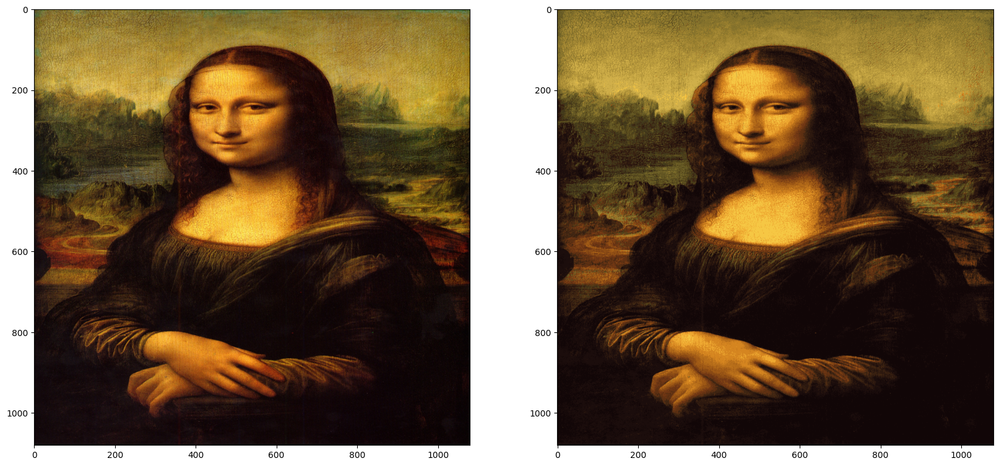

In [70]:
show_img_bbox(dataset.reverse(dataset[panel]), y_image)

#### c = 10

In [71]:
num_class = 10

##### fit

In [72]:
# model = FuzzyCMeansGaussianS2(num_class=10, epochs=50, threshold=.5, verbose=True)
model = KMeans(n_clusters=num_class, n_init=50, tol=tol, verbose=True)

model.fit(dataset.__getitem__(panel, blur=True, reshape=True), None)

Initialization complete
Iteration 0, inertia 5554.6028911955.
Converged at iteration 0: center shift 0.01326856770807392 within tolerance 0.020918775530731293.
Initialization complete
Iteration 0, inertia 5270.912249134047.
Converged at iteration 0: center shift 0.007409732402138051 within tolerance 0.020918775530731293.
Initialization complete
Iteration 0, inertia 5411.1141714720525.
Converged at iteration 0: center shift 0.009201476151666731 within tolerance 0.020918775530731293.
Initialization complete
Iteration 0, inertia 5147.550680506709.
Converged at iteration 0: center shift 0.007073332408712353 within tolerance 0.020918775530731293.
Initialization complete
Iteration 0, inertia 5419.1837447117805.
Converged at iteration 0: center shift 0.010639640944419755 within tolerance 0.020918775530731293.
Initialization complete
Iteration 0, inertia 5720.485843904812.
Converged at iteration 0: center shift 0.01286277254045466 within tolerance 0.020918775530731293.
Initialization complete


KMeans(n_clusters=10, n_init=50, tol=0.5, verbose=True)

In [73]:
model.cluster_centers_

array([[0.08522403, 0.03766002, 0.0389859 ],
       [0.64267066, 0.52147542, 0.19106716],
       [0.40754701, 0.2649187 , 0.09784567],
       [0.75203485, 0.63012664, 0.26098714],
       [0.18561177, 0.11803471, 0.06759712],
       [0.86094856, 0.5484393 , 0.13895789],
       [0.64085563, 0.34996006, 0.08836416],
       [0.94704897, 0.7242831 , 0.23864814],
       [0.49906482, 0.42961421, 0.16525673],
       [0.2919118 , 0.17231071, 0.08134276]])

In [74]:
y = model.predict(X)

In [75]:
y_image = reverse(model.cluster_centers_[y].reshape(dataset[panel].shape))

In [76]:
filename = img_path.split("/")[-1]
set_name = "results/minimal/k_means/art/"
save_model(model, f"{set_name}model/{num_class}/model.json")

print(str.upper(filename.split(".")[-1]))
dir_original_img = f"{set_name}imgs/original/"
if not os.path.isfile(dir_original_img):
    os.makedirs(dir_original_img, exist_ok=True)
Image.fromarray(dataset.reverse(dataset[panel])).save(f"{dir_original_img}{panel}{filename}.png")

dir_out_img = f"{set_name}imgs/{num_class}/"
if not os.path.isfile(dir_out_img):
    os.makedirs(dir_out_img, exist_ok=True)    
Image.fromarray(y_image).save(f"{dir_out_img}{panel}{filename}.png")

ssim, hssim, q, rmse, psnr = metricas(dataset.reverse(dataset[panel]), y_image, mean_result=False)
r = []
r.extend(ssim), r.extend(hssim), r.extend(q), r.extend(rmse), r.extend(psnr)
resultados.append(r)

JPG
por cor
SSIM : 0.9861 0.9807 0.8917
SSIM entre histogramas: 0.0662 0.1137 0.1887
UQI: 0.9861 0.9807 0.8917
MSER: 7.7240 7.3265 6.3904
PSNR: 26.9739 27.3894 29.4361
cinza
SSIM : 0.9863
SSIM entre histogramas: 0.0905
UQI: 0.9863
MSER: 6.9706
PSNR: 29.0053


##### show

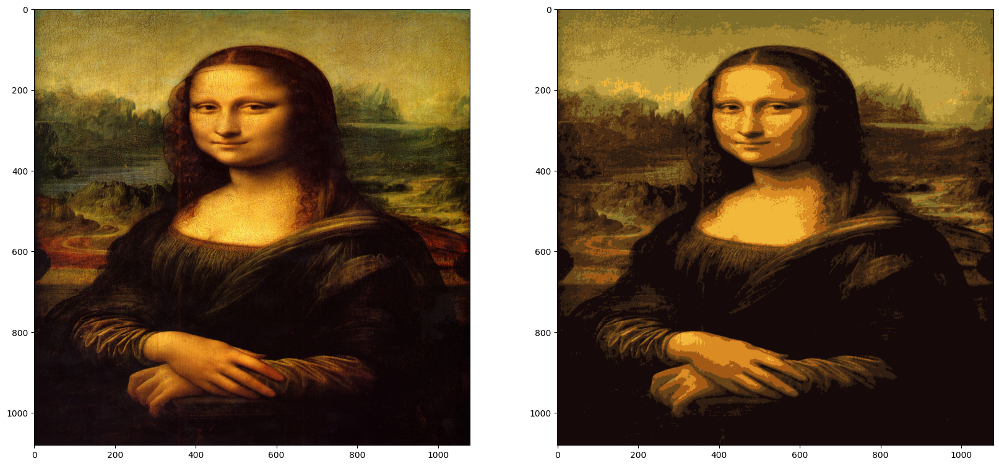

In [77]:
show_img_bbox(dataset.reverse(dataset[panel]), y_image)

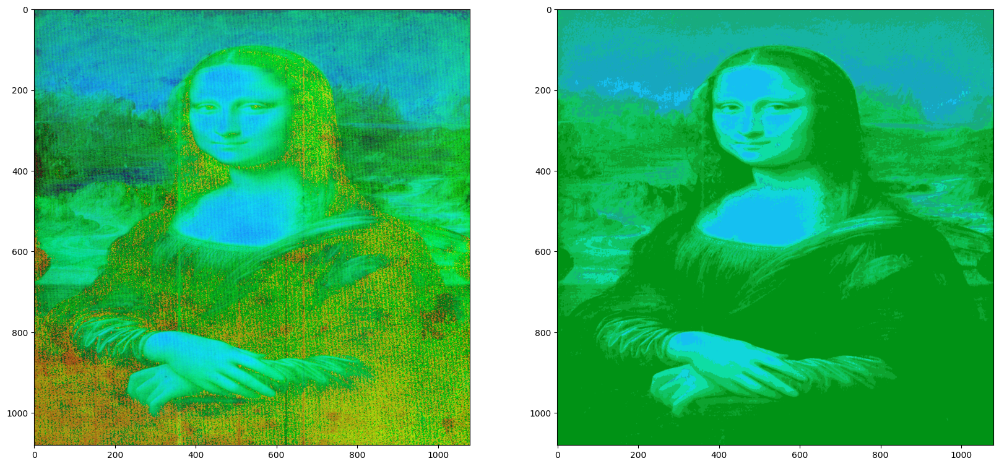

In [78]:
# show_imgs(dataset.reverse(dataset[panel]), dataset.reverse(model.G[y]))
x_hsv = cv2.cvtColor(dataset.reverse(dataset[panel]), cv2.COLOR_RGB2HSV)
y_hsv = cv2.cvtColor(y_image, cv2.COLOR_RGB2HSV)
show_img_bbox(x_hsv, y_hsv)

In [83]:
import numpy as np
from skimage.metrics import structural_similarity as ssim_skimage
# from skimage.metrics import q
# from skimage.metrics import niqe
from imquality import brisque
from brisque import BRISQUE

from PIL import Image
import cv2
from sewar.full_ref import uqi
from torchmetrics.image import UniversalImageQualityIndex, QualityWithNoReference #, ni
from torchmetrics.image import StructuralSimilarityIndexMeasure
import torch
import torchvision.transforms as transforms


img_path_original = "results/minimal/k_means/art/imgs/original/0leonardo-da-vinci_mona-lisa.jpg.png"
# img_path_original = "results/minimal/k_means/art/imgs/original/0leonardo-da-vinci_mona-lisa.jpg.png"
img_original = np.array(Image.open(img_path_original).convert("RGB"))

img_path_gaussian = "results/minimal/k_means/art/imgs/20/0leonardo-da-vinci_mona-lisa.jpg.png"
# img_path_gaussian = "results/minimal/k_means/art/imgs/10/0leonardo-da-vinci_mona-lisa.jpg.png"
img_gaussian = np.array(Image.open(img_path_gaussian).convert("RGB"))

# img_gaussian 


# _ = metricas(img_original, img_gaussian, mean_result=False)
# ssim_new(img_original, img_gaussian)
# img_path_original = 
# img1 = dataset.reverse(dataset[panel])
# img2 = y_image
channel = 0
k1 = 0.01
k2 = 0.03
L = img_gaussian[:,:,channel].max() - img_gaussian[:,:,channel].min()
c1 = (k1 * L) ** 2
c2 = (k2 * L) ** 2
c3 = c2 / 2
# c1, c2, c3

# print(np.mean(img_original, (0,1)))
mu_x = np.mean(img_original[:,:,channel])
mu_y = np.mean(img_gaussian[:,:,channel])
sigma_x = np.var(img_original[:,:,channel])
sigma_y = np.var(img_gaussian[:,:,channel])
sigma_xy = np.mean((img_original[:,:,channel] - mu_x) * (img_gaussian[:,:,channel] - mu_y))

# img_original_normalize = (img_original - mu_x)/sigma_x
# img_gaussian_normalize = (img_gaussian  - mu_x)/sigma_x

# img_gaussian[:,:,channel].max() - img_gaussian[:,:,channel].min()

uqi_tensor = UniversalImageQualityIndex()
qnr = QualityWithNoReference()
ssim_torch = StructuralSimilarityIndexMeasure()

img_original_tensor = transforms.ToTensor()(img_original)[np.newaxis]
img_gaussian_tensor = transforms.ToTensor()(img_gaussian)[np.newaxis] 

# img_original = img_original.astype(np.float32) / 255
# img_gaussian = img_gaussian.astype(np.float32) / 255

# print(img_gaussian_tensor[:,0,:3,:3])
# print(img_gaussian_tensor.shape)

cores = [
    "vermelho",
    "verde",
    "azul",
]

# print(img_original.shape)
# calc_brisque = BRISQUE(url=False)
# # print(brisque.calculate_features(Image.fromarray(img_original), kernel_size = 7, sigma = 7 / 6))
# print(calc_brisque.score(img_original))
# print(calc_brisque.score(img_gaussian))
# # print(cv2.quality.QualityBRISQUE.compute(img_original))
# exit(0)

# PIQE_gaussian = qnr(img_gaussian_tensor, {
#     "ms": img_original_tensor,
#     "pan": img_original_tensor,
# })
# PIQE_gaussian = qnr(Image.fromarray(img_gaussian), Image.fromarray(img_gaussian))

# print(f"qnr: {PIQE_gaussian}")



for channel in range(img_original.shape[-1]):
    ssim_value, diff= ssim_skimage(img_original[:,:,channel], img_gaussian[:,:,channel], full=True)
    
    # PIQE

    q = uqi(img_original[:,:,channel], img_gaussian[:,:,channel])  
    q_alternative = uqi_tensor(img_original_tensor[:,channel: channel + 1, :,:], 
                               img_gaussian_tensor[:,channel: channel + 1, :,:])
      
    ssim_torch_value = ssim_torch(img_original_tensor[:,channel: channel + 1, :,:], img_gaussian_tensor[:,channel: channel + 1, :,:])
    
    PIQE_gaussian = qnr(img_gaussian_tensor[:,channel: channel + 1, :,:], {
        "ms": img_original_tensor[:,channel: channel + 1, :,:],
        "pan": img_original_tensor[:,channel: channel + 1, :,:],
    })
    # PIQE_gaussian = qnr(Image.fromarray(img_gaussian), Image.fromarray(img_gaussian))

    print(10*"#", cores[channel])
    print(f"qnr: {PIQE_gaussian}")
    print("skimage.metrics.ssim", ssim_value)
    print("torchmetrics.image.ssim", ssim_torch_value.numpy())
    
    print("sewar.full_ref.uqi", q)
    print("torchmetrics.image.uqi", q_alternative.numpy())

img_original_gray = cv2.cvtColor(img_original, cv2.COLOR_RGB2GRAY)
img_gaussian_gray = cv2.cvtColor(img_gaussian, cv2.COLOR_RGB2GRAY)


img_original_gray_tensor = transforms.ToTensor()(img_original_gray)[np.newaxis]
img_gaussian_gray_tensor = transforms.ToTensor()(img_gaussian_gray)[np.newaxis] 

ssim_value, diff= ssim_skimage(img_original_gray, img_gaussian_gray, full=True)
ssim_torch_value = ssim_torch(img_original_gray_tensor, img_gaussian_gray_tensor)


channel = 0
# print(img_original_gray.shape)
# print(img_gaussian_gray.shape)

# print(img_original_gray_tensor.shape)
# print(img_gaussian_gray_tensor.shape)

PIQE_gaussian = qnr(img_gaussian_gray_tensor, {
    "ms": img_original_gray_tensor,
    "pan": img_original_gray_tensor,
})

q = uqi(img_original, img_gaussian)  
q_alternative = uqi_tensor(img_original_gray_tensor, 
                            img_gaussian_gray_tensor)  

print(10*"#", "cinza")
print(f"qnr: {PIQE_gaussian}")
print("skimage.metrics.ssim", ssim_value)
print("torchmetrics.image.ssim", ssim_torch_value.numpy())
print("sewar.full_ref.uqi", q)
print("torchmetrics.image.uqi", q_alternative.numpy())

########## vermelho
qnr: 0.5090980529785156
skimage.metrics.ssim 0.8745461551847238
torchmetrics.image.ssim 0.86789095
sewar.full_ref.uqi 0.9881504048455602
torchmetrics.image.uqi 0.7014261
########## verde
qnr: 0.49543678760528564
skimage.metrics.ssim 0.882775715609807
torchmetrics.image.ssim 0.8767295
sewar.full_ref.uqi 0.9636835455855534
torchmetrics.image.uqi 0.66581917
########## azul
qnr: 0.6809267997741699
skimage.metrics.ssim 0.7980972532175156
torchmetrics.image.ssim 0.6784572
sewar.full_ref.uqi 0.9392476653225174
torchmetrics.image.uqi 0.41814485
########## cinza
qnr: 0.4562380909919739
skimage.metrics.ssim 0.9109918730792682
torchmetrics.image.ssim 0.899167
sewar.full_ref.uqi 0.963693871917877
torchmetrics.image.uqi 0.7232968


In [80]:
# time change
# new row
# new column
# pure grid
# ecs_insert
# whole_row
# whole_column


In [81]:
title = [
    "ssim(r)",
    "ssim(g)",
    "ssim(b)",
    "ssim(gray)",
    "hssim(r)",
    "hssim(g)",
    "hssim(b)",
    "hssim(gray)",
    "uqi(r)",
    "uqi(g)",
    "uqi(b)",
    "uqi(gray)",
    "rmse(r)",
    "rmse(g)",
    "rmse(b)",
    "rmse(gray)",
    "psnr(r)",
    "psnr(g)",
    "psnr(b)",
    "psnr(gray)",
]

In [82]:
pd.DataFrame(
    np.array(resultados).T, index=title
).T.to_csv(f"results/minimal_blur/cmeans/metricas.csv")
print(resultados)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (6,) + inhomogeneous part.